In [57]:
import pandas as pd
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import LogisticRegression
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler

In [58]:
# Load the dataset
data = pd.read_csv("ai4i2020.csv")

# Check for missing values
print("Missing values before preprocessing:")
print(data.isnull().sum())
data.dropna(inplace=True)

# Encode categorical variables
label_encoder = LabelEncoder()
data['Type'] = label_encoder.fit_transform(data['Type'])

# Scale numerical features
scaler = StandardScaler()
numerical_features = ['Air temperature [K]', 'Process temperature [K]', 'Rotational speed [rpm]', 'Torque [Nm]', 'Tool wear [min]']
data[numerical_features] = scaler.fit_transform(data[numerical_features])

# Handling Outliers using IQR method
Q1 = data[numerical_features].quantile(0.25)
Q3 = data[numerical_features].quantile(0.75)
IQR = Q3 - Q1
data_cleaned = data[~((data[numerical_features] < (Q1 - 1.5 * IQR)) | (data[numerical_features] > (Q3 + 1.5 * IQR))).any(axis=1)]

# Create a copy of the cleaned data
data_cleaned = data_cleaned.copy()

# Feature Engineering: Creating 'Temperature Difference' feature
data_cleaned['Temperature Difference'] = data_cleaned['Air temperature [K]'] - data_cleaned['Process temperature [K]']

Missing values before preprocessing:
UDI                        0
Product ID                 0
Type                       0
Air temperature [K]        0
Process temperature [K]    0
Rotational speed [rpm]     0
Torque [Nm]                0
Tool wear [min]            0
Machine failure            0
TWF                        0
HDF                        0
PWF                        0
OSF                        0
RNF                        0
dtype: int64


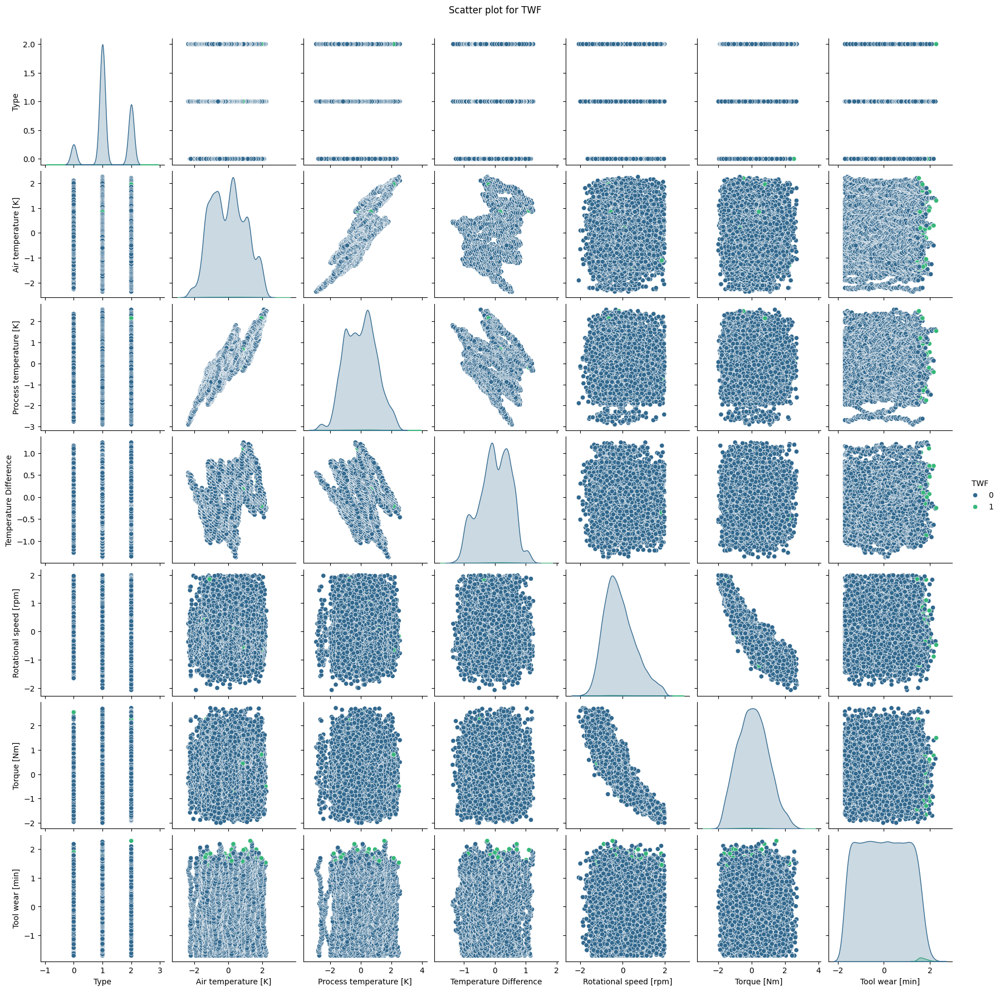

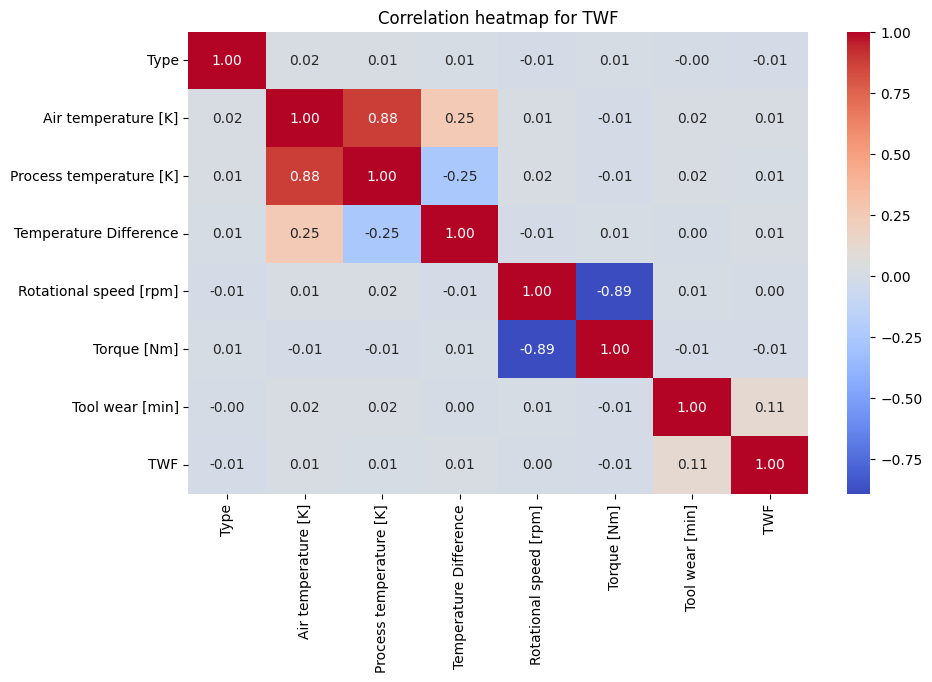

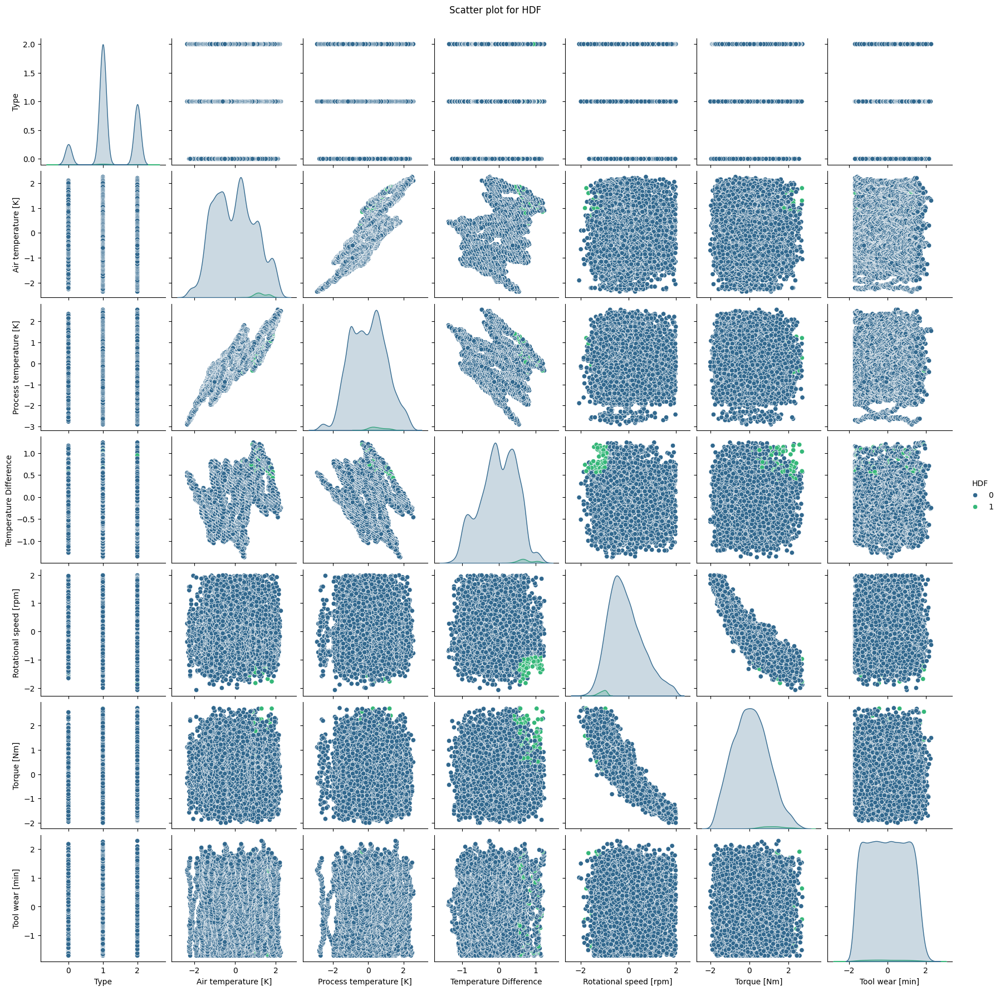

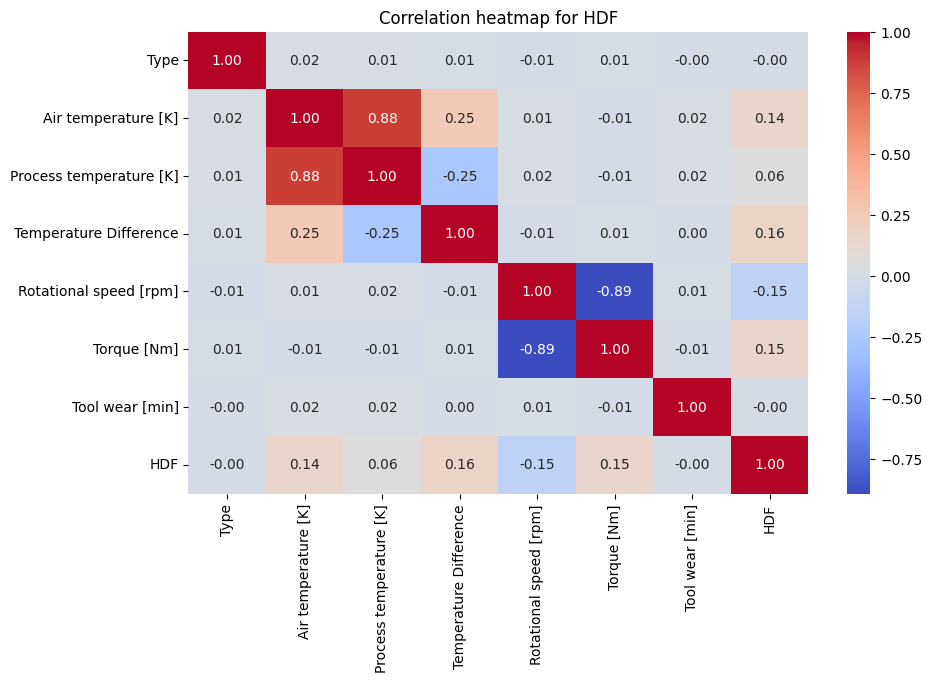

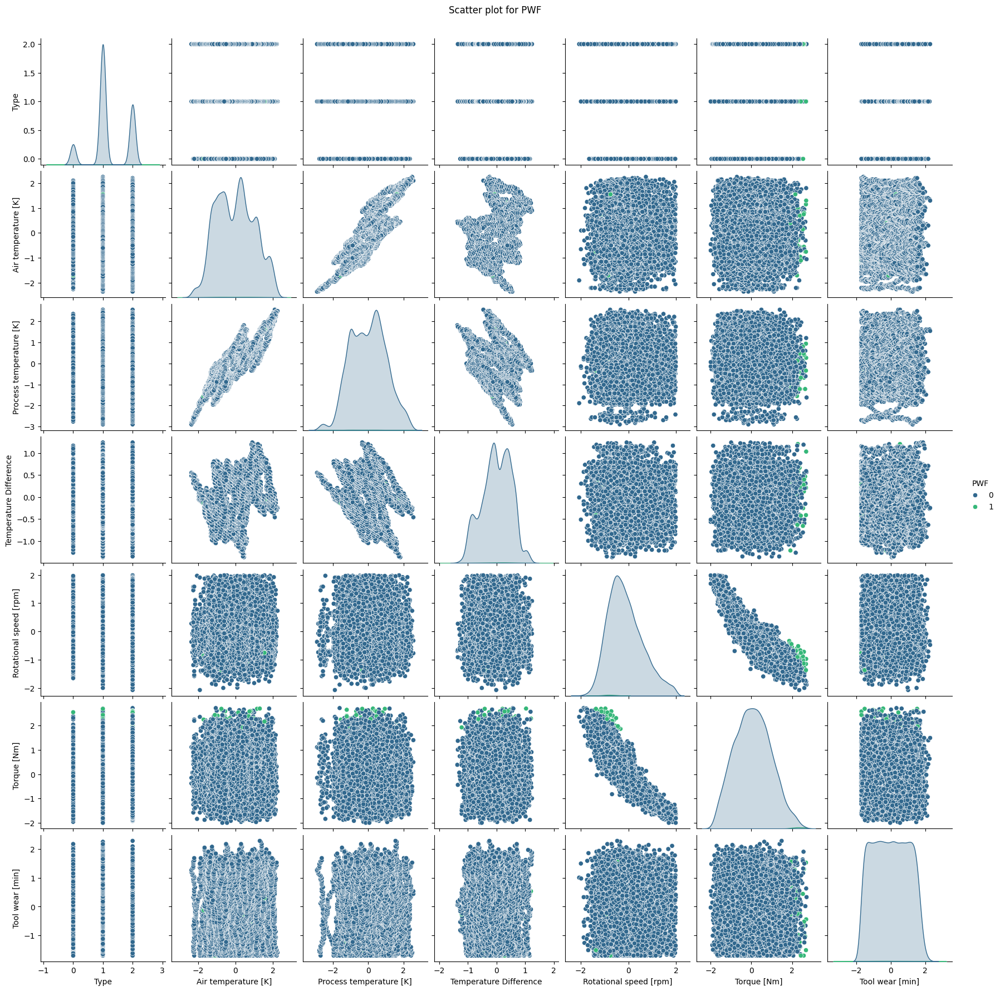

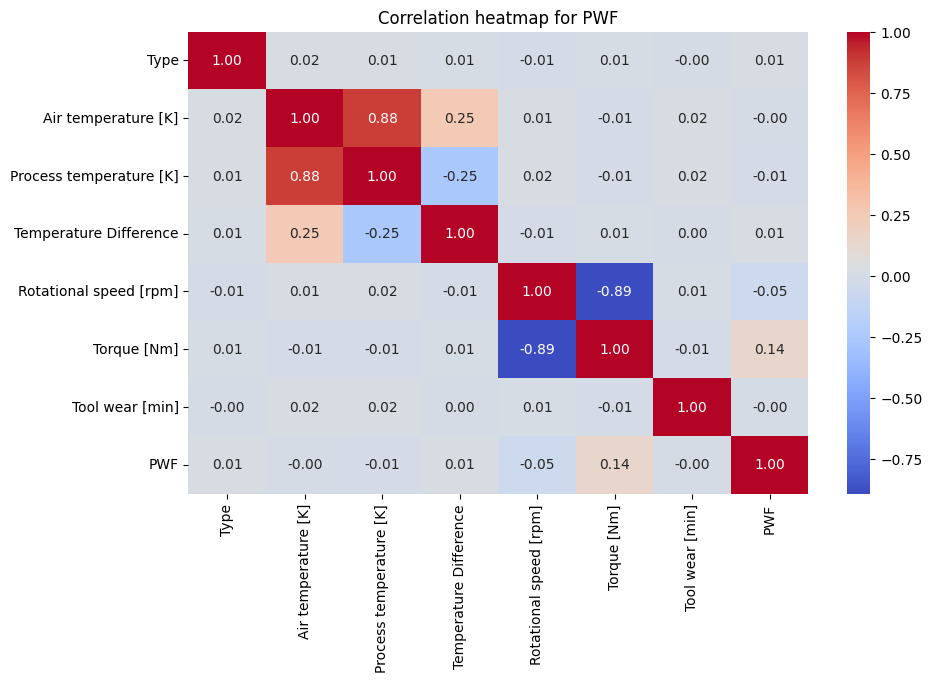

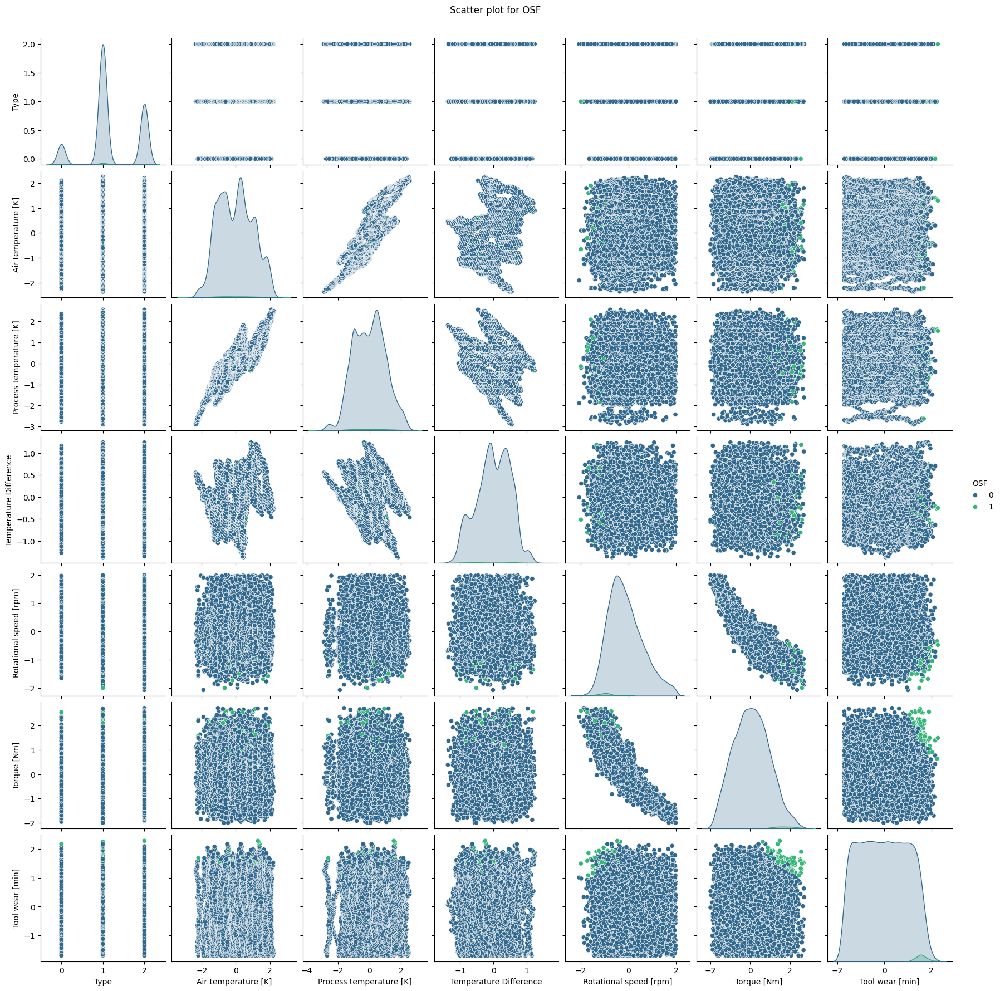

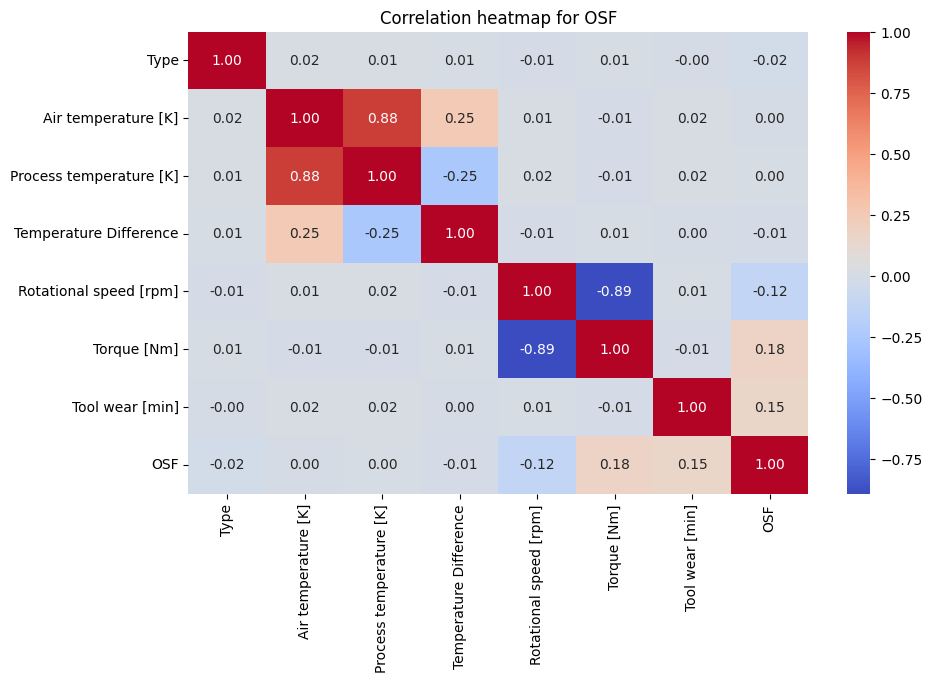

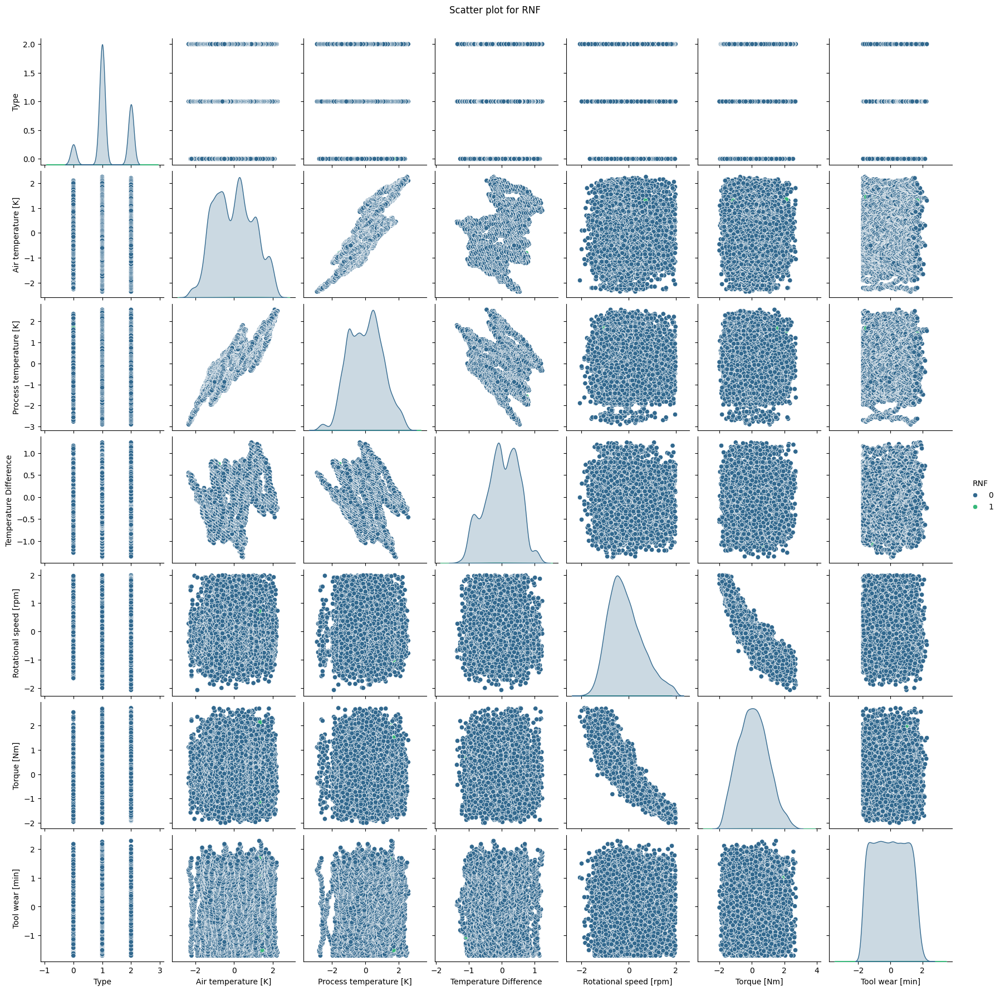

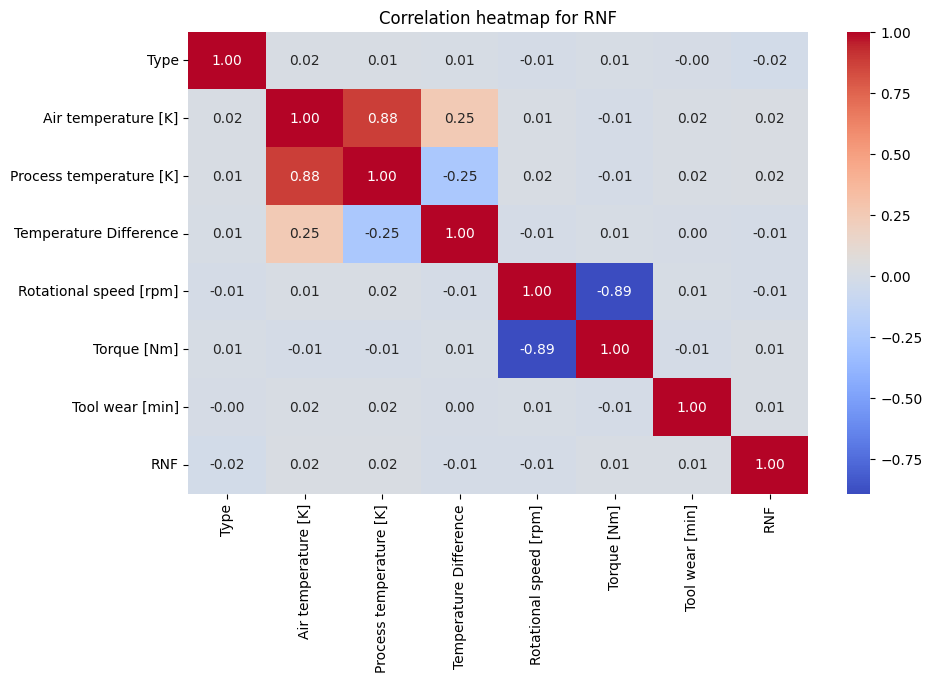

In [59]:
for failure_type in ['TWF', 'HDF', 'PWF', 'OSF', 'RNF']:
    # Select data for the current failure type
    failure_data = data_cleaned[['Type', 'Air temperature [K]', 'Process temperature [K]','Temperature Difference',
                         'Rotational speed [rpm]', 'Torque [Nm]', 'Tool wear [min]', failure_type]]

    # Create pairplot (scatter plot matrix)
    sns.pairplot(failure_data, hue=failure_type, palette='viridis')
    plt.suptitle(f'Scatter plot for {failure_type}', y=1.02)
    plt.show()

    # Create heatmap
    plt.figure(figsize=(10, 6))
    sns.heatmap(failure_data.corr(), annot=True, cmap='coolwarm', fmt=".2f")
    plt.title(f'Correlation heatmap for {failure_type}')
    plt.show()

In [60]:
# Split the dataset into features and target variable
X = data_cleaned.drop(['UDI', 'Product ID', 'Machine failure', 'TWF', 'HDF', 'PWF', 'OSF', 'RNF'], axis=1)
Failure_types = ['Machine failure','TWF', 'HDF', 'PWF', 'OSF', 'RNF']
accuracies = []
for failure_type in Failure_types:
    y = data_cleaned[failure_type]
    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    
    # Create and train the model with increased max_iter
    model = LogisticRegression(max_iter=1000)
    model.fit(X_train, y_train)
    
    # Make predictions on the test set
    y_pred = model.predict(X_test)
    
    # Calculate accuracy
    accuracy = accuracy_score(y_test, y_pred)
    accuracies.append(accuracy*100)
    print("Accuracy:", accuracy)

Accuracy: 0.9706652697747512
Accuracy: 0.9968569931901519
Accuracy: 0.9910948140387638
Accuracy: 0.9968569931901519
Accuracy: 0.9931901519119958
Accuracy: 0.997904662126768


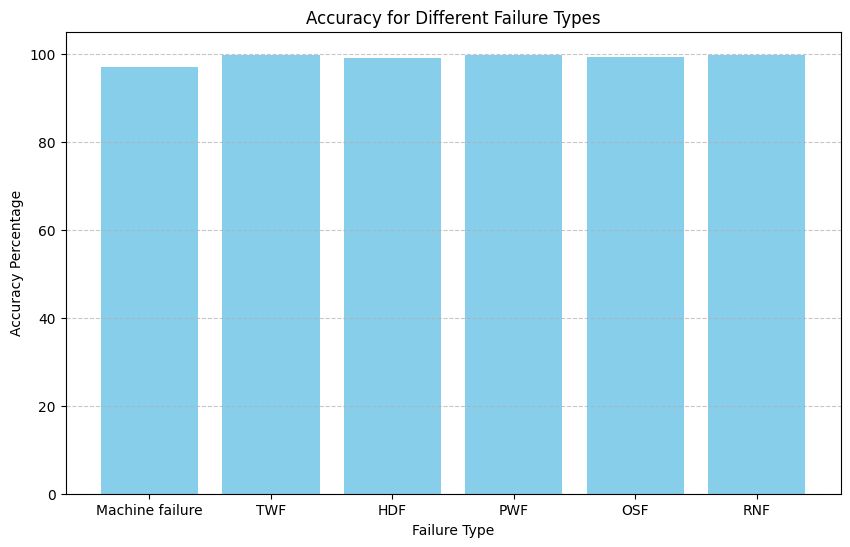

In [61]:
# Plot the accuracies
plt.figure(figsize=(10, 6))
plt.bar(Failure_types, accuracies, color='skyblue')
plt.xlabel('Failure Type')
plt.ylabel('Accuracy Percentage')
plt.title('Accuracy for Different Failure Types')
plt.ylim(0, 105)  # Set y-axis limit with padding
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()